## Advanced Lane Finding Project

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## 0. Parameters and Imports

In [1]:
CALCULATE_CALIBRATION_MODE = False
CALCULATE_THRESHOLDS = False
CALIBRATION_FILE = "calibration_pickle.p"

In [2]:
import numpy as np
import cv2
import os, fnmatch
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
#%matplotlib qt
%matplotlib inline

## 1. Camera calibration matrix and distortion coefficients given a set of chessboards.

In [3]:
def cal_undistort(img, pickle_switch=True, objpoints=None, imgpoints=None):
    #Read pickle-file
    if pickle_switch:
        with open(CALIBRATION_FILE, 'rb') as handle:
            pickle_dump = pickle.load(handle)
        objpoints = pickle_dump["objpoints"]
        imgpoints = pickle_dump["imgpoints"]
        
    img_size = (img.shape[1], img.shape[0])
    # Use cv2.calibrateCamera and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    img = cv2.undistort(img, mtx, dist, None, mtx)
    undist = np.copy(img)  # Delete this line
    return undist

In [4]:
if CALCULATE_CALIBRATION_MODE:
    #prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    #Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Load Chessboard Images
    PATH = 'camera_cal/'
    num_images = len(os.listdir(PATH))
    f, ax = plt.subplots(num_images, 3, figsize=(30,140))
    i = 0

    # Calculate chessboard parameters
    for fname in sorted(fnmatch.filter(os.listdir(PATH), '*.jpg')):
        img = cv2.imread(PATH+fname)

        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        ax[i][0].set_title("{} - Original Image".format(PATH+fname),fontsize='xx-large')
        ax[i][1].set_title("{} - Image with corners".format(PATH+fname),fontsize='xx-large')

        # If found, add object points, image points
        if ret == True:
            ax[i][0].imshow(img)
            # Draw and display the corners
            cv2.drawChessboardCorners(img, (9,6), corners, ret)
            #plt.imshow(img)
            ax[i][1].imshow(img)

            objpoints.append(objp)
            imgpoints.append(corners)
        else:
            img = cv2.imread(PATH+"calibration_fail.jpg")
            ax[i][0].imshow(img)
            ax[i][1].imshow(img)

        i+=1 

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["objpoints"] = objpoints
    dist_pickle["imgpoints"] = imgpoints
    with open(CALIBRATION_FILE, 'wb') as handle:
        pickle.dump(dist_pickle, handle)

    #Compute Undistorted Chessboard Images 
    i=0
    for fname in sorted(fnmatch.filter(os.listdir(PATH), '*.jpg')):
        img = cv2.imread(PATH+fname)
        undistorted = cal_undistort(img, False, objpoints, imgpoints)
        ax[i][2].set_title("{} - Undistorted".format(PATH+fname),fontsize='xx-large')
        ax[i][2].imshow(undistorted)
        i+=1
    
    # Plot 1) Original 2) Corner 3)Undistorted
    plt.plot()

In [5]:
#Test for Calibration using pickle file
if CALCULATE_CALIBRATION_MODE:
    fname= "calibration2.jpg"
    img = cv2.imread(PATH+fname)
    undistorted = cal_undistort(img, pickle_switch=True)
    plt.imshow(undistorted)

## 2. Apply a distortion correction to raw images.

0
straight_lines1.jpg
Saving file in test_images/undistorted/straight_lines1.jpg
1
straight_lines2.jpg
Saving file in test_images/undistorted/straight_lines2.jpg
2
test1.jpg
Saving file in test_images/undistorted/test1.jpg
3
test2.jpg
Saving file in test_images/undistorted/test2.jpg
4
test3.jpg
Saving file in test_images/undistorted/test3.jpg
5
test4.jpg
Saving file in test_images/undistorted/test4.jpg
6
test5.jpg
Saving file in test_images/undistorted/test5.jpg
7
test6.jpg
Saving file in test_images/undistorted/test6.jpg


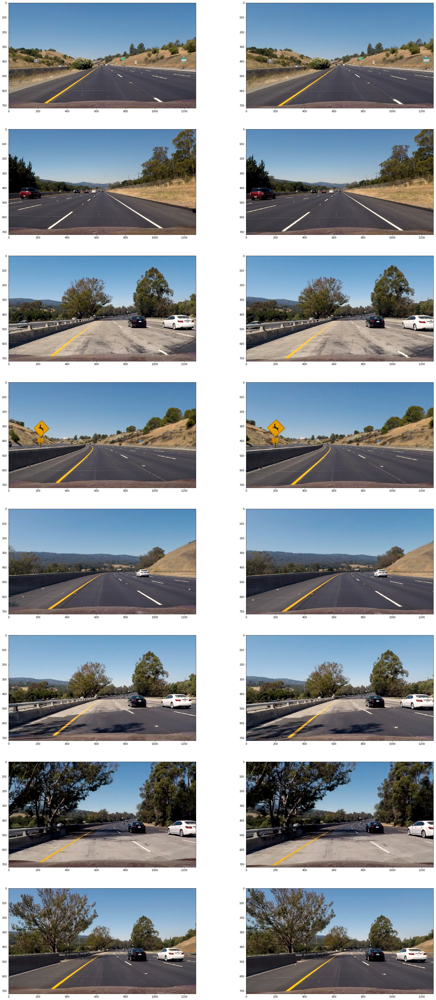

In [6]:
PATH = 'test_images/'

num_images = len(fnmatch.filter(os.listdir(PATH), '*.jpg'))
f, ax = plt.subplots(num_images, 2, figsize=(30,70))
i=0

for fname in sorted(fnmatch.filter(os.listdir(PATH), '*.jpg')):       
    print(i)
    print(fname)
    img = cv2.imread(PATH+fname)
    ax[i][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    undistorted = cal_undistort(img, pickle_switch=True)
    #Save undistorted images
    print("Saving file in {}".format(PATH+'undistorted/'+fname))
    
    cv2.imwrite(PATH+'undistorted/'+fname,undistorted)
    ax[i][1].imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    i+=1
    1
if CALCULATE_CALIBRATION_MODE:
    plt.plot()

## 3. Use color transforms, gradients, etc., to create a thresholded binary image.

In [7]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

In [8]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


In [9]:
# Define a function to threshold an image for a given range and Sobel kernel
#thresh = (0.7, 1.3),
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [10]:
# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

In [11]:
#Apply different techniques and combine
def thresholded_binary(img):
    #grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    #apply different techniques
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)
    mag_binary = mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 120))
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
    hls_binary = hls_select(img, thresh=(180, 255))   
    
    #combine
    combined = np.zeros_like(dir_binary)
    combined[(((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))) | (hls_binary == 1)] = 1  
    
    return combined

In [12]:
if CALCULATE_THRESHOLDS:
    PATH = 'test_images/'
    num_images = len(fnmatch.filter(os.listdir(PATH), '*.jpg'))
    f, ax = plt.subplots(num_images, 2, figsize=(30,70))
    i=0
    for fname in sorted(fnmatch.filter(os.listdir(PATH), '*.jpg')):         
        #read and show
        img = cv2.imread(PATH+"undistorted/"+fname)
        ax[i][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

        combined = thresholded_binary(img)

        #save combined
        cv2.imwrite(PATH+'combine/'+fname,combined)

        ax[i][1].imshow(combined, cmap='gray')
        i+=1

    plt.plot()

## Apply a perspective transform to rectify binary image ("birds-eye view").

In [13]:
def birds_eye_view(img):
    #corners = np.float32([[284,673],[606,442],[676,442], [1033,673]]) //Too blurry!!
    corners = np.float32([[284,673],[582,458],[701,442], [1033,673]]) 
    
    top_left = np.array([corners[0, 0], 0])
    top_right = np.array([corners[3, 0], 0])
    offset = [50, 0]

    img_size = (img.shape[1], img.shape[0])
    src = np.float32([corners[0], corners[1], corners[2], corners[3]])
    dst = np.float32([corners[0] + offset, top_left + offset, top_right - offset, corners[3] - offset])
    
    M = cv2.getPerspectiveTransform(src, dst)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped

In [171]:
def get_M_inverse(img):
    #corners = np.float32([[284,673],[606,442],[676,442], [1033,673]]) //Too blurry!!
    corners = np.float32([[284,673],[582,458],[701,442], [1033,673]]) 
    
    top_left = np.array([corners[0, 0], 0])
    top_right = np.array([corners[3, 0], 0])
    offset = [50, 0]

    img_size = (img.shape[1], img.shape[0])
    src = np.float32([corners[0], corners[1], corners[2], corners[3]])
    dst = np.float32([corners[0] + offset, top_left + offset, top_right - offset, corners[3] - offset])
    
    M_inv = cv2.getPerspectiveTransform(dst, src)
    
    return M_inv

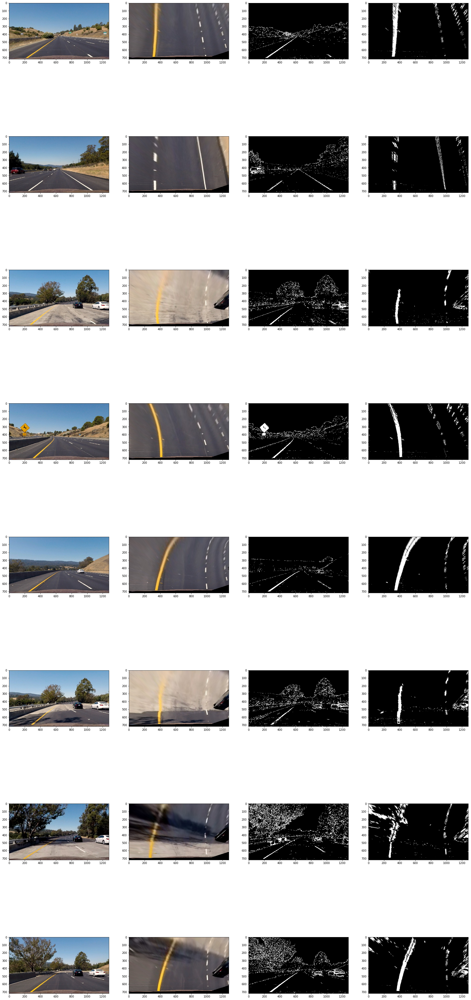

In [14]:
num_images = len(fnmatch.filter(os.listdir(PATH), '*.jpg'))

f, ax = plt.subplots(num_images, 4, figsize=(30,70))
i=0
for fname in sorted(fnmatch.filter(os.listdir(PATH), '*.jpg')):          
    #Bird Eye of undistorted
    img = cv2.imread(PATH+'undistorted/'+fname)
    ax[i][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    warped = birds_eye_view(img)
    ax[i][1].imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    

    #Bird Eye of Binary Combined
    binary = thresholded_binary(img)

    ax[i][2].imshow(binary, cmap='gray')
    binary = birds_eye_view(binary)
    ax[i][3].imshow(binary, cmap='gray')
    
    if i == 1:
        binary_warped = binary
    
    i+=1

#invertieren -> Minv = cv2.getPerspectiveTransform(dst, src)


## 5. Detect lane pixels and fit to find the lane boundary.

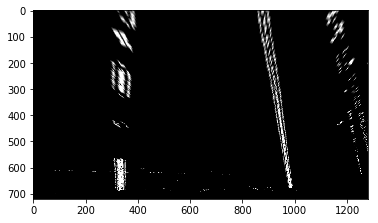

In [77]:
plt.imshow(binary_warped, cmap='gray') 

# test

1.0

# //test

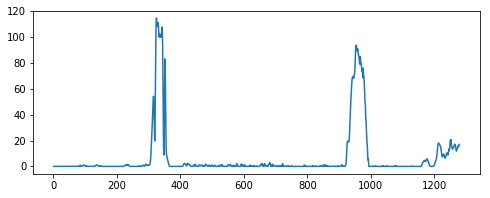

In [113]:
# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image   
histogram = np.sum(binary_warped[np.int(binary_warped.shape[0]/2):,:], axis=0)
plt.figure(figsize=(8, 3))
plt.plot(histogram)
plt.show()

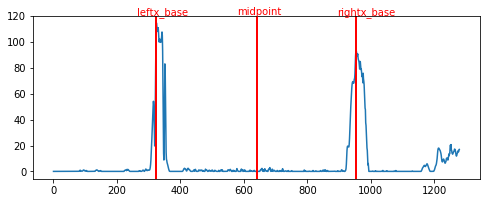

In [114]:
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

TEXT_HEIGHT = 121
#Draw midpoint, lefx and rightx base
plt.figure(figsize=(8, 3))
plt.plot(histogram)

#midpoint
plt.axvline(midpoint, linewidth=2, color='r')
plt.text(midpoint-60,TEXT_HEIGHT,'midpoint',rotation=0, color='r')

#leftx_base
plt.axvline(leftx_base, linewidth=2, color='r')
plt.text(leftx_base-60,TEXT_HEIGHT,'leftx_base',rotation=0, color='r')

#rightx_base
plt.axvline(rightx_base, linewidth=2, color='r')
plt.text(rightx_base-60,TEXT_HEIGHT,'rightx_base',rotation=0, color='r')
plt.show()



In [95]:
binary_warped.shape

(720, 1280)

In [123]:
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
print("leftx_current: {}".format(leftx_current))
print("rightx_current: {}".format(leftx_current))
# Set the width of the windows +/- margin
margin = 100
#margin = 75
# Set minimum number of pixels found to recenter window
minpix = 50
#minpix = 35
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(1,0,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,0,1), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

leftx_current: 324
rightx_current: 324


In [116]:
a = np.zeros((100,10))
a[1][2] = 31
a[3][4] = 31
print(a.nonzero()[0])
print(a.nonzero()[1])

b = np.array([[1,2,3,4],[5,6,7,8]])
b

[1 3]
[2 4]


array([[1, 2, 3, 4],
       [5, 6, 7, 8]])

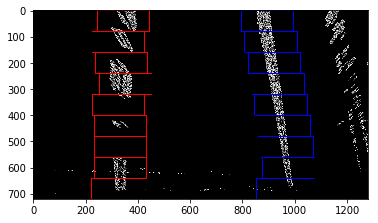

In [124]:
plt.imshow(out_img)

(720, 0)

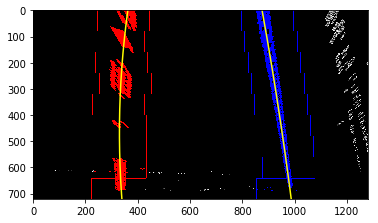

In [133]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [1, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 1]

plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [141]:
def find_lanes(binary_warped):
    histogram = np.sum(binary_warped[np.int(binary_warped.shape[0]/2):,:], axis=0)
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    #margin = 75
    # Set minimum number of pixels found to recenter window
    minpix = 50
    #minpix = 35
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height

        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(1,0,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,0,1), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [1, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 1]
        
    return out_img, ploty, left_fitx, right_fitx, left_curverad, right_curverad

## 6. Determine the curvature of the lane and vehicle position with respect to center.

### In Pixelspace

In [129]:
# In PIXEL-Space
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)

3445.69644772 13864.3683743


### In Meter

In [134]:

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m

1122.76424852 m 4446.04804011 m


1122.76424852
4446.04804011


(720, 0)

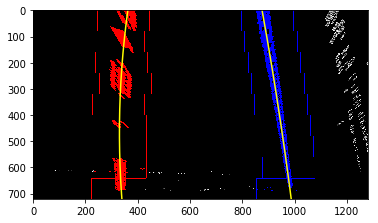

In [144]:
out, ploty, l_x, r_x, l_c, r_c = find_lanes(binary_warped)
plt.imshow(out)
print(l)
print(r)

plt.imshow(out)
plt.plot(l_x, ploty, color='yellow')
plt.plot(r_x, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [182]:
def complete_line_finding(img):
    img = thresholded_binary(img)
    img = birds_eye_view(img)
    out, ploty, l_x, r_x, l_c, r_c = find_lanes(img)
    
    return out, ploty, l_x, r_x, l_c, r_c    

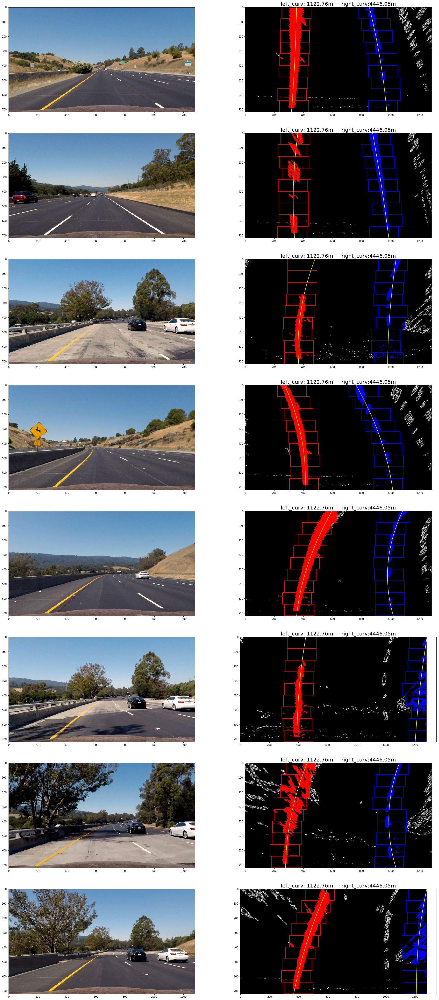

In [160]:
# all pictures

num_images = len(fnmatch.filter(os.listdir(PATH), '*.jpg'))

f, ax = plt.subplots(num_images, 2, figsize=(30,70))
i=0
for fname in sorted(fnmatch.filter(os.listdir(PATH), '*.jpg')):          
    #Bird Eye of undistorted
    img = cv2.imread(PATH+'undistorted/'+fname)
    ax[i][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    out, ploty, l_x, r_x, l_c, r_c = complete_line_finding(img)
    ax[i][1].imshow(out)
    
    ax[i][1].plot(l_x, ploty, color='yellow')
    ax[i][1].plot(r_x, ploty, color='yellow')
    
    ax[i][1].set_title("left_curv: {:.2f}m     right_curv:{:.2f}m".format(l_c,r_c), fontsize=20)
        
    i+=1

In [84]:
# # Assume you now have a new warped binary image 
# # from the next frame of video (also called "binary_warped")
# # It's now much easier to find line pixels!
# nonzero = binary_warped.nonzero()
# nonzeroy = np.array(nonzero[0])
# nonzerox = np.array(nonzero[1])
# margin = 100
# left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
# right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# # Again, extract left and right line pixel positions
# leftx = nonzerox[left_lane_inds]
# lefty = nonzeroy[left_lane_inds] 
# rightx = nonzerox[right_lane_inds]
# righty = nonzeroy[right_lane_inds]
# # Fit a second order polynomial to each
# left_fit = np.polyfit(lefty, leftx, 2)
# right_fit = np.polyfit(righty, rightx, 2)
# # Generate x and y values for plotting
# ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
# left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
# right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

In [139]:
# # Create an image to draw on and an image to show the selection window
# out_img = np.dstack((binary_warped, binary_warped, binary_warped))*1
# window_img = np.zeros_like(out_img)
# # Color in left and right line pixels
# out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [1, 0, 0]
# out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 1]

# # Generate a polygon to illustrate the search window area
# # And recast the x and y points into usable format for cv2.fillPoly()
# left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
# left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
# left_line_pts = np.hstack((left_line_window1, left_line_window2))
# right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
# right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
# right_line_pts = np.hstack((right_line_window1, right_line_window2))

# # Draw the lane onto the warped blank image
# cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,1, 0))
# cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,1, 0))
# result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
# plt.imshow(result)
# plt.plot(left_fitx, ploty, color='yellow')
# plt.plot(right_fitx, ploty, color='yellow')
# plt.xlim(0, 1280)
# plt.ylim(720, 0)

## 7) Warp the detected lane boundaries back onto the original image.

(720, 1280)


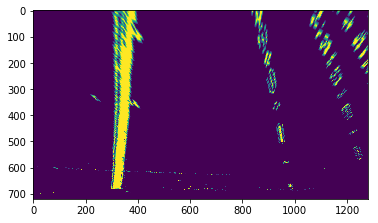

In [176]:
image = plt.imread("test_images/straight_lines1.jpg")

binary = thresholded_binary(image)
warped = birds_eye_view(binary)

plt.imshow(warped)
print(warped.shape)

Minv = get_M_inverse(image)

In [197]:
def draw_on_street(image, ploty, l_x, r_x):
   
    binary = thresholded_binary(image)
    warped = birds_eye_view(binary)
    Minv = get_M_inverse(image)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    return result

In [199]:
image = cv2.imread("test_images/straight_lines1.jpg")

out, ploty, l_x, r_x, l_c, r_c = complete_line_finding(img)
result = draw_on_street(image, ploty, l_x, r_x)

plt.imshow(result)

ax[i][1].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

error: /home/travis/miniconda/conda-bld/conda_1486587071158/work/opencv-3.1.0/modules/imgproc/src/color.cpp:7935: error: (-215) depth == CV_8U || depth == CV_16U || depth == CV_32F in function cvtColor
